In [149]:
# # @title Montaje de drive y carga de requerimientos
# from google.colab import drive
# drive.mount('/content/drive')

# !pip install -r '/content/drive/MyDrive/tfm_data_scientist/requirements_colab.txt' -q

# # Insert the directory
# import sys
# sys.path.insert(0,'/content/drive/MyDrive/tfm_data_scientist/notebook')

# 01. Librerías

In [150]:
import os
import warnings
from random import sample

import numpy as np
import pandas as pd
from dython.nominal import associations

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib.cbook import boxplot_stats

from common.utils import *

warnings.filterwarnings("ignore")

# 02. Carga de datos

In [151]:
# definición de rutas
path_input = os.path.join(os.path.dirname(os.getcwd()), 'data/input/')
path_output = os.path.join(os.path.dirname(os.getcwd()), 'data/output/')

# # colab path
# path_input = '/content/drive/MyDrive/tfm_data_scientist/data/input/'
# path_output = '/content/drive/MyDrive/tfm_data_scientist/data/output/'

In [152]:
# se crean las rutas si es que no existen
paths = [path_input, path_output]
for path in paths:
    os.makedirs(path, exist_ok=True)

In [153]:
# data de entrenamiento
data_train = pd.read_csv(path_input + 'train.csv' , low_memory=False)

# está tabla fue generada posterior a las comprobaciones iniciales
# y se utiliza como guía para el tratamiento de variables
desc_vars = pd.read_csv(path_input + 'descripcion_variables.csv')

In [154]:
data_train.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


# 03. Análisis exploratorio

## 03.01. Comprobaciones iniciales de variables

**01 ID: Unique identification of an entry**

In [155]:
# cantidad de caracteres
data_train.ID.apply(len).unique()

array([6, 7], dtype=int64)

In [156]:
# consistencia de prefijo
data_train.ID.str.split('x',expand=True)[0].apply(len).unique(), data_train.ID.str.split('x',expand=True)[1].apply(len).unique()

(array([1], dtype=int64), array([4, 5], dtype=int64))

**02 Customer_ID: Unique identification of an entry**

In [157]:
# cantidad de caracteres
data_train.Customer_ID.apply(len).unique()

array([ 9, 10], dtype=int64)

In [158]:
# consistencia de prefijo
data_train.Customer_ID.str.split('x',expand=True)[0].unique()

array(['CUS_0'], dtype=object)

**03 Month: Month of the year**

In [159]:
# cantidad de meses
data_train.Month.unique().tolist(), len(data_train.Month.unique())

(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August'], 8)

**04 Name: Name of a person**

In [160]:
# 10 nombres más frecuentes
data_train.Name.value_counts()[:10]

Langep                44
Stevex                44
Vaughanl              39
Jessicad              39
Raymondr              38
Danielz               38
Deepa Seetharamanm    38
Jessica Wohlt         38
Nate Raymondw         37
Nicko                 37
Name: Name, dtype: int64

**05 Age: Age of the person**

In [161]:
# indetificaciones de errores
Age_errors = identificador_errores(data_train.Age) 
sample(Age_errors,5), len(Age_errors)

(['37_', '31_', '38_', '21_', '28_'], 4939)

**06 SSN: Social security number of a person**

In [162]:
# valores atípicos
data_train[data_train.SSN.map(len)==9].SSN.unique()

array(['#F%$D@*&8'], dtype=object)

**07 Occupation: Occupation of the person**

In [163]:
# conteo de ocupaciones
data_train.Occupation.value_counts()

_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64

**08 Annual_Income: Annual income of the person**

In [164]:
# indetificaciones de errores
Annual_Income_errors = identificador_errores(data_train.Annual_Income)
sample(Annual_Income_errors,5), len(Annual_Income_errors)

(['104527.6_', '50298.42_', '14774.495_', '74557.58_', '34800.96_'], 6980)

**09 Monthly_Inhand_Salary: Monthly base salary of a person**

In [165]:
data_train.Monthly_Inhand_Salary.astype(float).sample(5).tolist()

[1644.3975, 3938.193333333333, 1769.5283333333334, 8379.0825, nan]

**10 Num_Bank_Accounts: Number of bank accounts a person holds**

In [166]:
# indetificaciones de errores
Num_of_Delayed_Payment_errors = identificador_errores(data_train.Num_of_Delayed_Payment)
sample(Num_of_Delayed_Payment_errors,5), len(Num_of_Delayed_Payment_errors)

(['16_', '15_', '6_', '11_', '11_'], 2744)

**11 Num_Credit_Card: Number of other credit cards held by a person**

In [167]:
data_train.Num_Credit_Card.astype(int).tolist()[0:5]

[4, 4, 4, 4, 4]

**12 Interest_Rate: Interest rate on credit card**

In [168]:
data_train.Interest_Rate.astype(int).tolist()[0:5]

[3, 3, 3, 3, 3]

**13 Num_of_Loan: Number of loans taken from the bank**

In [169]:
# indetificaciones de errores
Num_of_Loan_errors = identificador_errores(data_train.Num_of_Loan)
sample(Num_of_Loan_errors,5), len(Num_of_Loan_errors)

(['7_', '5_', '4_', '3_', '6_'], 4785)

**14 Type_of_Loan:  Types of loan taken by a person**

In [170]:
# largo string
data_train.Type_of_Loan.fillna('').apply(len).value_counts().sort_index()[-10:]

168    64
169    16
170    16
171    24
172    32
173    16
174     8
177     8
178     8
182     8
Name: Type_of_Loan, dtype: int64

In [171]:
# tipo de deuda duplicada
data_train[data_train.Type_of_Loan.fillna('').apply(len)==182]['Type_of_Loan'].unique().tolist()[0]

'Debt Consolidation Loan, Home Equity Loan, Credit-Builder Loan, Personal Loan, Debt Consolidation Loan, Debt Consolidation Loan, Mortgage Loan, Credit-Builder Loan, and Not Specified'

**15 Delay_from_due_date: Average number of days delayed from the payment date**

In [172]:
data_train.Delay_from_due_date.astype(int).tolist()[0:5]

[3, -1, 3, 5, 6]

**16 Num_of_Delayed_Payment:  Average number of payments delayed by a person**

In [173]:
# indetificaciones de errores
Num_of_Delayed_Payment_errors = identificador_errores(data_train.Num_of_Delayed_Payment)
sample(Num_of_Delayed_Payment_errors,5), len(Num_of_Delayed_Payment_errors)

(['12_', '8_', '16_', '14_', '14_'], 2744)

**17 Changed_Credit_Limit: The percentage change in credit card limit**

In [174]:
# indetificaciones de errores
Changed_Credit_Limit_errors = identificador_errores(data_train.Changed_Credit_Limit)
set(Changed_Credit_Limit_errors), len(Changed_Credit_Limit_errors)

({'_'}, 2091)

**18 Num_Credit_Inquiries:  Number of credit card inquiries**

In [175]:
data_train.Num_Credit_Inquiries.astype(float).sample(10).tolist()

[9.0, 7.0, 2.0, 10.0, 4.0, 13.0, 11.0, 2.0, 0.0, 5.0]

**19 Credit_Mix: Classification of the mix of credits**

In [176]:
# conteo de variedad de créditos
data_train.Credit_Mix.value_counts()

Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64

**20 Outstanding_Debt:  Remaining debt to be paid (in USD)**

In [177]:
# indetificaciones de errores
Outstanding_Debt_errors = identificador_errores(data_train.Outstanding_Debt)
sample(Outstanding_Debt_errors, 5), len(Outstanding_Debt_errors)

(['726.75_', '3176.77_', '3723.83_', '432.53_', '1268.49_'], 1009)

**21 Credit_Utilization_Ratio: Utilization ratio of credit card**

In [178]:
data_train.Credit_Utilization_Ratio.astype(float).sample(3).tolist()

[30.4334187129954, 38.23163058074546, 36.725270273368686]

**22 Credit_History_Age: Age of credit history of the person**

In [179]:
# consistencia de separador
data_train.Credit_History_Age.str.split(' and ',expand=True).sample(10)

,0,1
87813,20 Years,3 Months
69645,14 Years,7 Months
18956,30 Years,7 Months
83596,4 Years,2 Months
4533,30 Years,10 Months
86117,16 Years,10 Months
96513,15 Years,3 Months
71515,28 Years,0 Months
73697,18 Years,10 Months
85209,19 Years,3 Months


**23 Payment_of_Min_Amount: Represents whether only the minimum amount was paid by the person**

In [180]:
# conteo del comportamiento de pago mínimo
data_train.Payment_of_Min_Amount.value_counts()


Yes    52326
No     35667
NM     12007
Name: Payment_of_Min_Amount, dtype: int64

**24 Total_EMI_per_month: Monthly EMI (Equated Monthly Installments) payments (in USD)**

In [181]:
data_train.Total_EMI_per_month.astype(float).sample(5).tolist()

[202.85778301011135,
 71.8255587315648,
 18849.0,
 19.437808676258506,
 18.439801078717608]

**25 Amount_invested_monthly: Monthly amount invested by the customer (in USD)**

In [182]:
# indetificaciones de errores
Amount_invested_monthly_errors = identificador_errores(data_train.Amount_invested_monthly)
set(Amount_invested_monthly_errors), len(Amount_invested_monthly_errors)

({'__10000__'}, 4305)

**26 Payment_Behaviour: Payment behavior of the customer (in USD)**

In [183]:
# conteo comportamiento pago cliente
data_train.Payment_Behaviour.value_counts()

Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: Payment_Behaviour, dtype: int64

**27 Monthly_Balance: Monthly balance amount of the customer (in USD)**

In [184]:
# indetificaciones de errores
Monthly_Balance_errors = identificador_errores(data_train.Monthly_Balance)
set(Monthly_Balance_errors), len(Monthly_Balance_errors)

({'__-333333333333333333333333333__'}, 9)

**28 Credit_Score: Represents the bracket of credit score (Poor, Standard, Good)**

In [185]:
# conteo credit score
data_train.Credit_Score.value_counts()

Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

## 03.02. Corrección de errores detectados

### 03.02.01. Corrección de variables cuantitativas

In [186]:
# identificación de variables numéricas
desc_vars[desc_vars.Tipo.isin(['float', 'int'])]

,ID,Variable,Tipo,Descripción Inglés,Descripción Español,Comentarios
4,5,Age,int,Age of the person,Edad del cliente,valores terminados en '_'
7,8,Annual_Income,float,Annual income of the person,Ingreso anual del cliente,valores terminados en '_'
8,9,Monthly_Inhand_Salary,float,Monthly base salary of a person,Salario base mensual del cliente,NaN
9,10,Num_Bank_Accounts,int,Number of bank accounts a person holds,Número de cuentas bancarias que posee el cliente,NaN
10,11,Num_Credit_Card,int,Number of other credit cards held by a person,Número de tarjetas de crédito que posee el cli...,NaN
11,12,Interest_Rate,int,Interest rate on credit card,Tasa de interés asociada a las tarjetas de cré...,NaN
12,13,Num_of_Loan,int,Number of loans taken from the bank,Número de préstamos que tiene con el banco,valores terminados en '_'
14,15,Delay_from_due_date,int,Average number of days delayed from the paymen...,Retraso promedio en días en el pago desde la f...,NaN
15,16,Num_of_Delayed_Payment,int,Average number of payments delayed by a person,Número promedio de pagos retrasados,valores terminados en '_'
16,17,Changed_Credit_Limit,float,The percentage change in credit card limit,Porcentaje de cambio en el limite de la tarjet...,valores '_'


**Reemplazo de valores numissing no declarados**

In [187]:
# reemplazo de valores
data_train.Amount_invested_monthly = data_train.Amount_invested_monthly.replace('__10000__', np.nan).astype(float)
data_train.Monthly_Balance = data_train.Monthly_Balance.replace('__-333333333333333333333333333__', np.nan).astype(float)

**Corrección de errores detectados**

In [188]:
# limpieza variables
vars_num = desc_vars[desc_vars.Tipo.isin(['float', 'int'])].reset_index(drop=True)[:-2].Variable.tolist()

for var in vars_num:
    data_train[var] = data_train[var].apply(limpieza_cambio)

In [189]:
# se eliminan datos unicos de identificación
data_train.drop(['ID','Customer_ID','Name','SSN'],axis =1 , inplace =True)

### 03.02.02. Corrección de variables cualitativas

In [190]:
# identificación de variables cualitativas
desc_vars[~desc_vars.Tipo.isin(['float', 'int'])].reset_index(drop=True)

,ID,Variable,Tipo,Descripción Inglés,Descripción Español,Comentarios
0,1,ID,string,Unique identification of an entry,Identificador único de registro,prefijo 0x
1,2,Customer_ID,string,Uniqueidentification of a person,Identificador único de cliente,prefijo CUS_0
2,3,Month,string,Month of the year,Mes del año,Sólo tiene 8 meses
3,4,Name,string,Name of a person,Nombre del cliente,NaN
4,6,SSN,string,Social security number of a person,Número de Seguro Social,valores '#F%$D@*&8'
5,7,Occupation,string,Occupation of the person,Ocupación o título del cliente,valores '_______'
6,14,Type_of_Loan,string,Types of loan taken by a person,Tipo o categoría del préstamo,cadena string contiene valores duplicados
7,19,Credit_Mix,string,Classification of the mix of credits,Variedad de tipos de crédito en el perfil fina...,valores '_'
8,22,Credit_History_Age,string,Age of credit history of the person,Antigüedad del historial crediticio del cliente.,se puede convertir a flotante
9,23,Payment_of_Min_Amount,string,Represents whether only the minimum amount was...,Comportamiento de pago con respecto al monto m...,valores NM


**7 Occupation**

In [191]:
# evaluación de missing no declarado, se realiza reemplazo 
data_train.Occupation.replace('_______', 'Other', inplace=True)

**14 Type_of_Loan**

In [192]:
# reemplazo missings y eliminacion de duplicados
data_train.Type_of_Loan = data_train.Type_of_Loan.fillna('Not Specified')\
                                                 .str.replace(' and ', ' ')\
                                                 .str.split(',')\
                                                 .apply(set)\
                                                 .apply(','.join)

**19 Credit_Mix**

In [193]:
# evaluación de missing no declarado
cm_eval = data_train.groupby(['Credit_Mix', 'Credit_Score']).agg(Credit_Score_Count=('Credit_Score','count'))

<AxesSubplot: xlabel='Credit_Mix'>

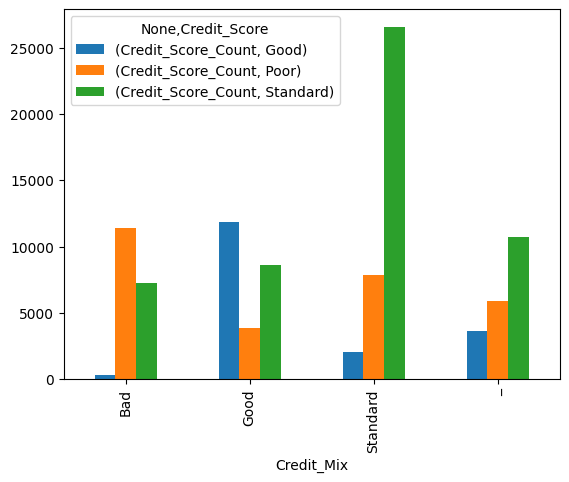

In [194]:
cm_eval.unstack().plot(kind='bar')

In [195]:
cm_eval.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).rename(columns={'Credit_Score_Count': 'Count_Percentage'})

Count_Percentage
Credit_Mix Credit_Score                  
Bad        Good                  1.516668
           Poor                 60.082153
           Standard             38.401180
Good       Good                 48.794017
           Poor                 15.864733
           Standard             35.341250
Standard   Good                  5.600482
           Poor                 21.543902
           Standard             72.855616
_          Good                 17.935132
           Poor                 29.061649
           Standard             53.003219

In [196]:
# reemplazo '_' por missing
data_train['Credit_Mix'] = data_train['Credit_Mix'].replace(['_', 'Bad'], [np.nan, 'Poor']) # 'Missing'

**22 Credit_History_Age**

In [197]:
# conversión a float
data_train.Credit_History_Age = data_train.Credit_History_Age.str.split(' and ',expand=True)[0].str.replace(' Years', '').astype(float)\
                                + data_train.Credit_History_Age.str.split(' and ',expand=True)[1].str.replace(' Months', '').astype(float) / 12

**26 Payment_Behaviour**

In [198]:
# evaluación de missing no declarado
data_train['Payment_Behaviour'] = data_train['Payment_Behaviour'].replace('!@9#%8', np.nan) # 'Missing'

**Normalización de variables**

In [199]:
vars_str = data_train.select_dtypes(exclude=['int', 'float']).columns.tolist()

In [200]:
data_train[vars_str] = data_train[vars_str].apply(lambda x: x.str.strip())
data_train[vars_str] = data_train[vars_str].apply(lambda x: x.str.lower())

## 03.03. Análisis Univariante

### 03.03.01. Variable Respuesta

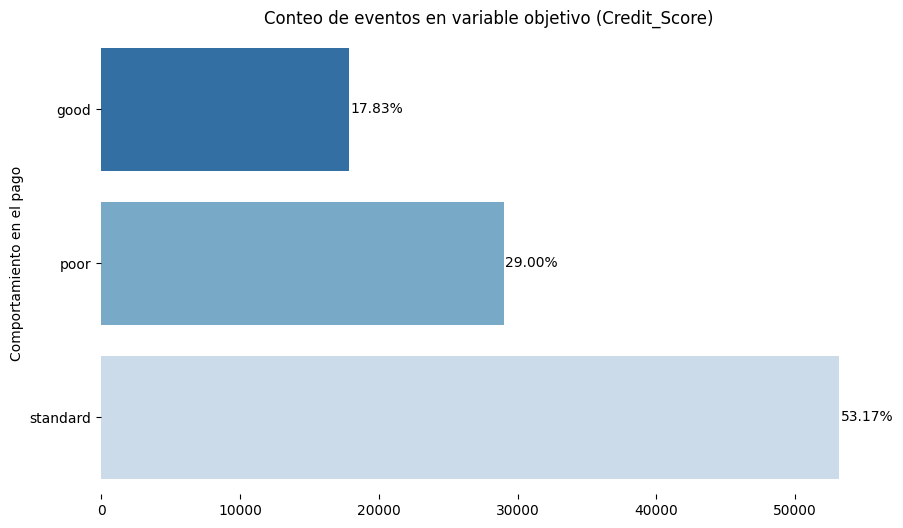

In [201]:
# conteo de registros únicos para cada categoria de la variable objetivo
credit_score_counts = data_train['Credit_Score'].value_counts().sort_values()
plt.figure(figsize=(10, 6))
pal = sns.color_palette("Blues", len(credit_score_counts))
rank = credit_score_counts.argsort().argsort()
ax = sns.barplot(x=credit_score_counts, y=credit_score_counts.index, palette=reversed(pal), orient='h')


total = len(data_train)
for i in range(credit_score_counts.shape[0]):
    count = credit_score_counts.iloc[i]
    percentage = '{:.2f}%'.format(100 * count / total)
    x = count  + 2000  
    y = i 
    ax.annotate(percentage, (x, y), ha='center', va='center')
plt.title("Conteo de eventos en variable objetivo (Credit_Score)")
plt.ylabel("Comportamiento en el pago")
ax.set(xlabel=None)
plt.box(False)
plt.show()

### 03.03.02. Análisis de variables cuantitativas

In [202]:
num_vars = data_train.select_dtypes(include=['int', 'float'])

In [203]:
descrio_num_vars = num_vars.describe(percentiles=[.25, .5, .75]).loc[['count', 'mean', 'std', '25%', '50%', '75%', 'min', 'max']].round(2).T
descrio_num_vars.insert(1,'missing %',num_vars.apply(lambda x: x.isna().sum()/num_vars.shape[0]*100))

In [204]:
descrio_num_vars["Coeficiente de Variación"] = descrio_num_vars['std'] / descrio_num_vars['mean']
descrio_num_vars['Asimetría'] = num_vars.apply(lambda x: x.skew())

In [205]:
stats = boxplot_stats(num_vars)
outliers = []
for col, stat in zip(num_vars.columns.tolist(), stats):
    # print(f'Outliers para: {col}')
    num_outliers = stat['fliers'].shape[0]
    outliers.append(num_outliers)
    # print(num_outliers)

In [206]:
f'Total de valores Outliers entre las variables cuantitativas: {sum(outliers)}'

'Total de valores Outliers entre las variables cuantitativas: 31605'

In [207]:
descrio_num_vars['% Outliers'] = outliers
descrio_num_vars['% Outliers'] = descrio_num_vars['% Outliers'].astype(float) / descrio_num_vars['count'] * 100

In [208]:
descrio_num_vars

,count,missing %,mean,std,25%,50%,75%,min,max,Coeficiente de Variación,Asimetría,% Outliers
Age,100000.0,0.000,110.65,686.24,24.00,33.00,42.00,-500.00,8698.00,6.201898,9.207631,2.781
Annual_Income,100000.0,0.000,176415.70,1429618.05,19457.50,37578.61,72790.92,7005.93,24198062.00,8.103689,12.512173,2.783
Monthly_Inhand_Salary,84998.0,15.002,4194.17,3183.69,1625.57,3093.75,5957.45,303.65,15204.63,0.759075,1.127272,0.000
Num_Bank_Accounts,100000.0,0.000,17.09,117.40,3.00,6.00,7.00,-1.00,1798.00,6.869514,11.202482,1.315
Num_Credit_Card,100000.0,0.000,22.47,129.06,4.00,5.00,7.00,0.00,1499.00,5.743658,8.458017,2.271
Interest_Rate,100000.0,0.000,72.47,466.42,8.00,13.00,20.00,1.00,5797.00,6.436043,9.006015,2.034
Num_of_Loan,100000.0,0.000,3.01,62.65,1.00,3.00,5.00,-100.00,1496.00,20.813953,15.980049,4.348
Delay_from_due_date,100000.0,0.000,21.07,14.86,10.00,18.00,28.00,-5.00,67.00,0.705268,0.966395,4.002
Num_of_Delayed_Payment,92998.0,7.002,30.92,226.03,9.00,14.00,18.00,-3.00,4397.00,7.310155,14.313136,0.000
Changed_Credit_Limit,97909.0,2.091,10.39,6.79,5.32,9.40,14.87,-6.49,36.97,0.653513,0.638783,0.000


In [209]:
descrio_num_vars.to_excel(path_output + 'descripción_variables_cuantitativas.xlsx', sheet_name='resumen')

**Inspección gráfica: Distribución de valores**

In [210]:
# Distribución de valores continuos
# solo se renderizan los primeros para que el archivo se pueda ver en GitHub
for col in num_vars.columns.tolist()[:4]:
    fig = px.histogram(data_train[col], x=col, marginal="box") 
    fig.show()

### 03.03.03. Análisis de variables cualitativas

In [211]:
cat_vars = data_train.drop('Credit_Score', axis=1).select_dtypes(exclude=['int', 'float'])

In [212]:
descrio_cat_vars = cat_vars.describe().T
descrio_cat_vars.insert(1,'missing %',cat_vars.apply(lambda x: x.str.contains('nan', na=True).sum()/cat_vars.shape[0]*100))

In [213]:
descrio_cat_vars

,count,missing %,unique,top,freq
Month,100000,0.000,8,january,12500
Occupation,100000,0.000,16,other,7062
Type_of_Loan,100000,0.000,3293,not specified,12816
Credit_Mix,79805,20.195,3,standard,36479
Payment_of_Min_Amount,100000,0.000,3,yes,52326
Payment_Behaviour,92400,7.600,6,low_spent_small_value_payments,25513


In [214]:
descrio_cat_vars.to_excel(path_output + 'descripción_variables_cualitativas.xlsx', sheet_name='resumen')

**Inspección gráfica: Distribución de valores**

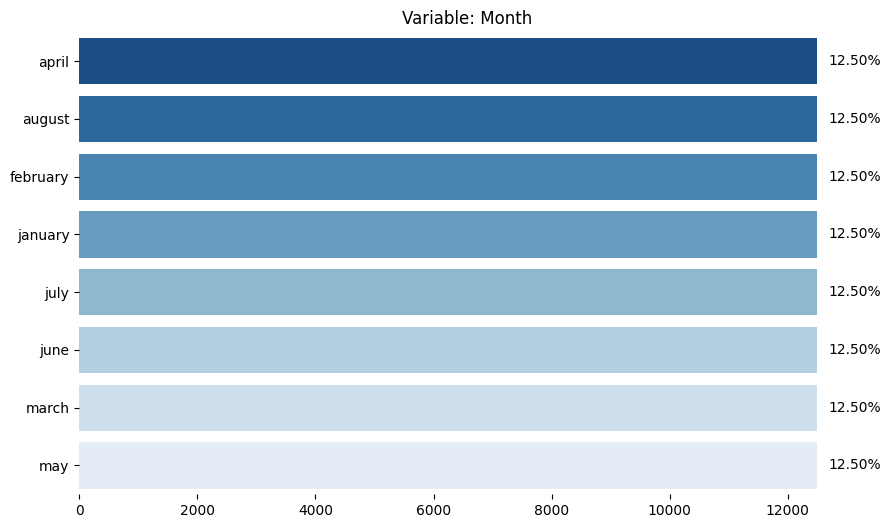

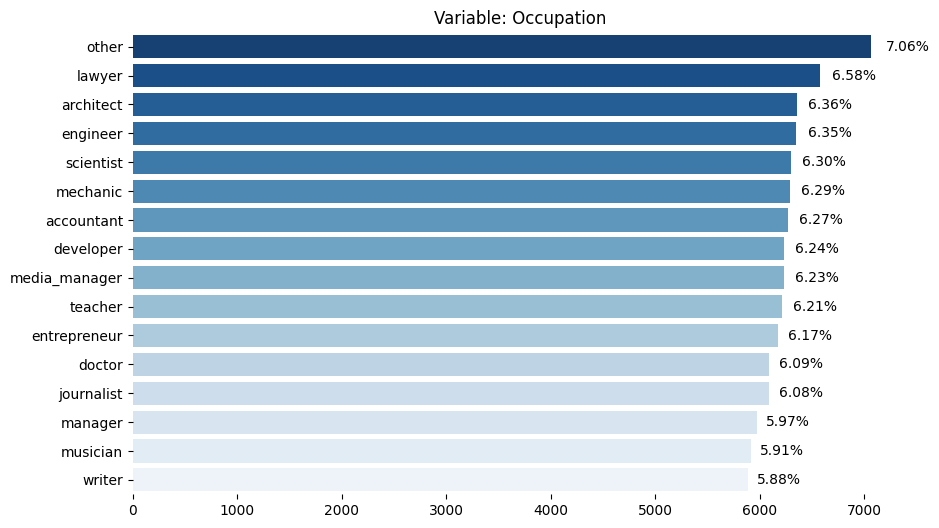

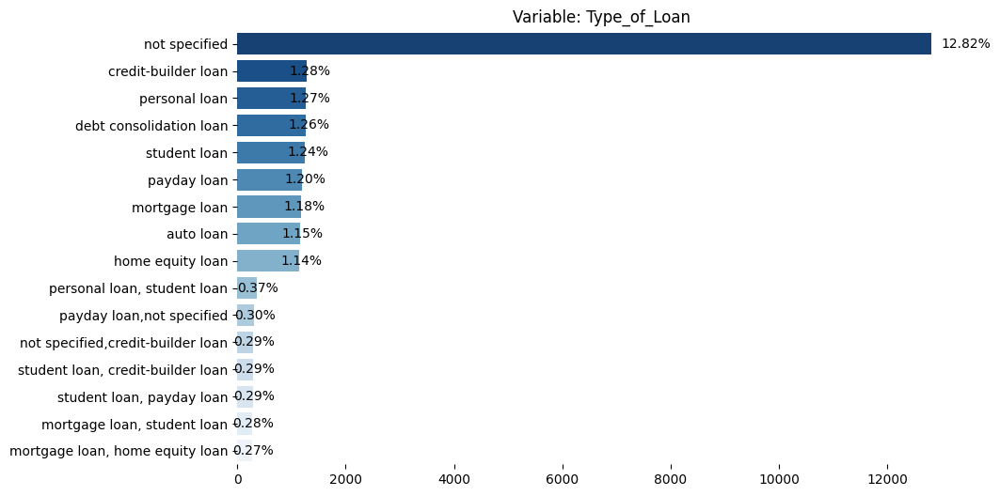

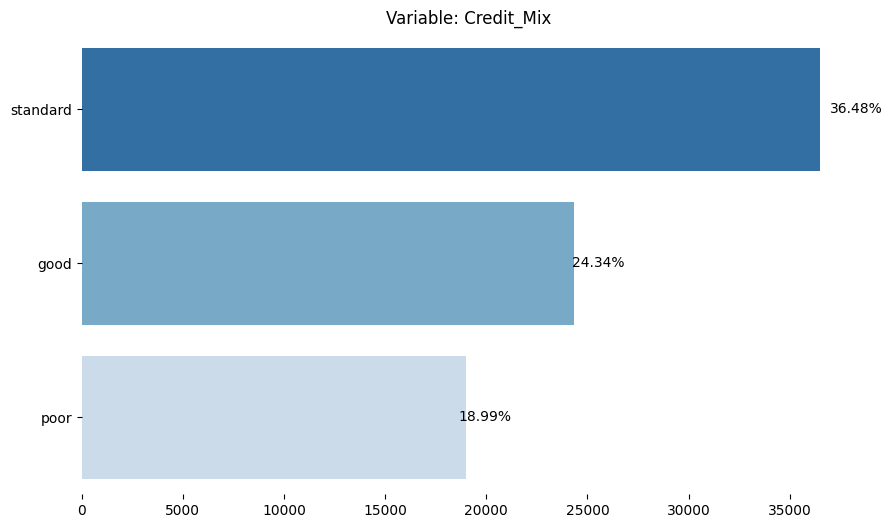

In [215]:
# solo se renderizan los primeros para que el archivo se pueda ver en GitHub
for col in cat_vars.columns.tolist()[:4]:
    # data
    data_sns = data_train.drop('Credit_Score', axis=1).groupby(col)[col].count().sort_values(ascending=False)
    data_sns = data_sns.iloc[:16]
    # chart
    plt.figure(figsize=(10, 6))
    pal = sns.color_palette("Blues", len(data_sns))
    ax = sns.barplot(x=data_sns, y=data_sns.index, palette=reversed(pal), orient = 'h')
    for i in range(data_sns.shape[0]):
        count = data_sns.iloc[i]
        percentage = '{:.2f}%'.format(100 * count / total)
        x = count*1.0501
        y = i 
        ax.annotate(percentage, (x, y), ha='center', va='center')
    plt.title(f'Variable: {col}')
    ax.set(xlabel=None, ylabel=None)
    plt.box(False)
    plt.show()

In [216]:
# se elimina la variable Month
data_train.drop(['Month'], axis = 1 , inplace = True)

### 03.03.04. Identificación de potenciales variables categóricas

In [217]:
df_temp = data_train.loc[:,data_train.nunique() <= 30]

In [218]:
cols = [pd.unique(df_temp[col]) for col in df_temp.columns]

In [219]:
unique_values_df = pd.DataFrame()
for col in cols:
    additional_cols = pd.DataFrame(col)
    unique_values_df = pd.concat([unique_values_df, additional_cols], axis=1)

In [220]:
unique_values_df.columns = df_temp.columns
unique_values_df.apply(lambda x: x.sort_values().values)

,Occupation,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
0,accountant,good,nm,high_spent_large_value_payments,good
1,architect,poor,no,high_spent_medium_value_payments,poor
2,developer,standard,yes,high_spent_small_value_payments,standard
3,doctor,NaN,NaN,low_spent_large_value_payments,NaN
4,engineer,NaN,NaN,low_spent_medium_value_payments,NaN
5,entrepreneur,NaN,NaN,low_spent_small_value_payments,NaN
6,journalist,NaN,NaN,NaN,NaN
7,lawyer,NaN,NaN,NaN,NaN
8,manager,NaN,NaN,NaN,NaN
9,mechanic,NaN,NaN,NaN,NaN


## 03.04 Análisis Bivariante

### 03.04.01. Correlación entre variables cuantitativas

In [221]:
num_vars.join(data_train.Credit_Score.replace(['good', 'standard', 'poor'], [3, 2, 1]))

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,809.98,26.822620,22.083333,49.574949,80.415295,312.494089,3
1,23.0,19114.12,NaN,3.0,4.0,3.0,4.0,-1.0,NaN,11.27,4.0,809.98,31.944960,NaN,49.574949,118.280222,284.629162,3
2,-500.0,19114.12,NaN,3.0,4.0,3.0,4.0,3.0,7.0,NaN,4.0,809.98,28.609352,22.250000,49.574949,81.699521,331.209863,3
3,23.0,19114.12,NaN,3.0,4.0,3.0,4.0,5.0,4.0,6.27,4.0,809.98,31.377862,22.333333,49.574949,199.458074,223.451310,3
4,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,6.0,NaN,11.27,4.0,809.98,24.797347,22.416667,49.574949,41.420153,341.489231,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,23.0,7.0,11.50,3.0,502.38,34.663572,31.500000,35.104023,60.971333,479.866228,1
99996,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,18.0,7.0,11.50,3.0,502.38,40.565631,31.583333,35.104023,54.185950,496.651610,1
99997,25.0,39628.99,3359.415833,4.0,6.0,5729.0,2.0,27.0,6.0,11.50,3.0,502.38,41.255522,31.666667,35.104023,24.028477,516.809083,1
99998,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,20.0,NaN,11.50,3.0,502.38,33.638208,31.750000,35.104023,251.672582,319.164979,2


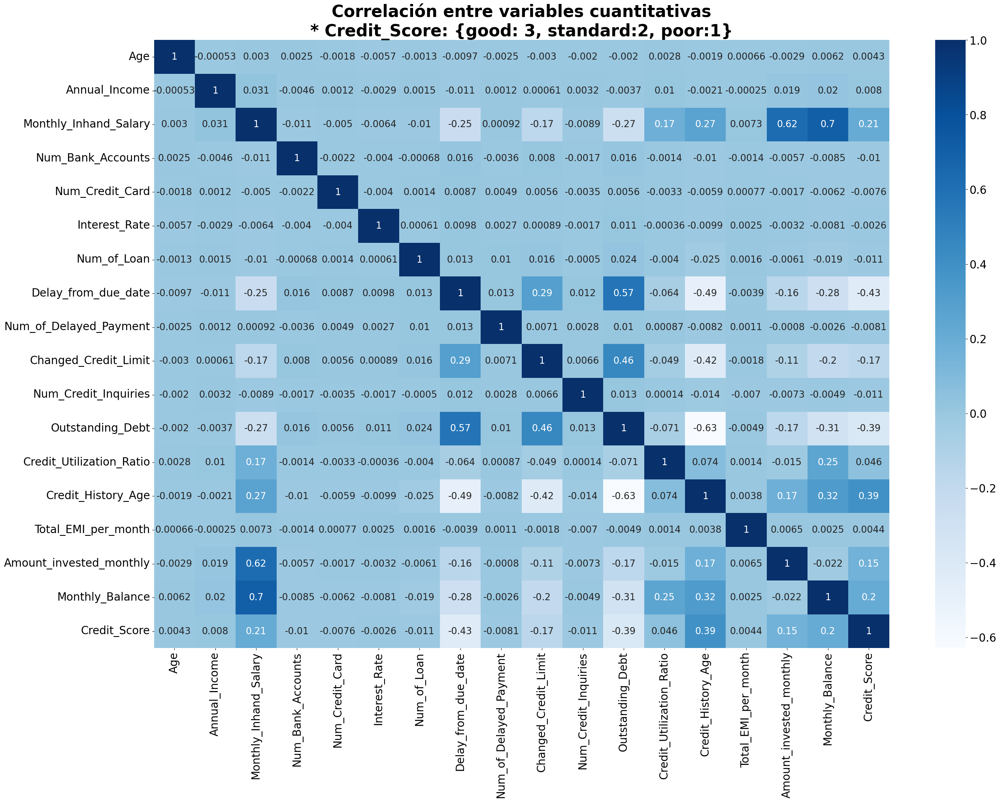

In [222]:
correlaciones = num_vars.join(data_train.Credit_Score.replace(['good', 'standard', 'poor'], [3, 2, 1])).corr()
plt.figure(figsize=(30,20))
ax = sns.heatmap(correlaciones, annot=True , cmap ="Blues", annot_kws={'size': 17})
# use matplotlib.colorbar.Colorbar object
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize = 20)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize = 20)
plt.title("Correlación entre variables cuantitativas\n* Credit_Score: {good: 3, standard:2, poor:1}", fontsize=30, fontweight="bold")
plt.show()

### 03.04.02 Correlación entre variables cualitativas utilizando v de cramer

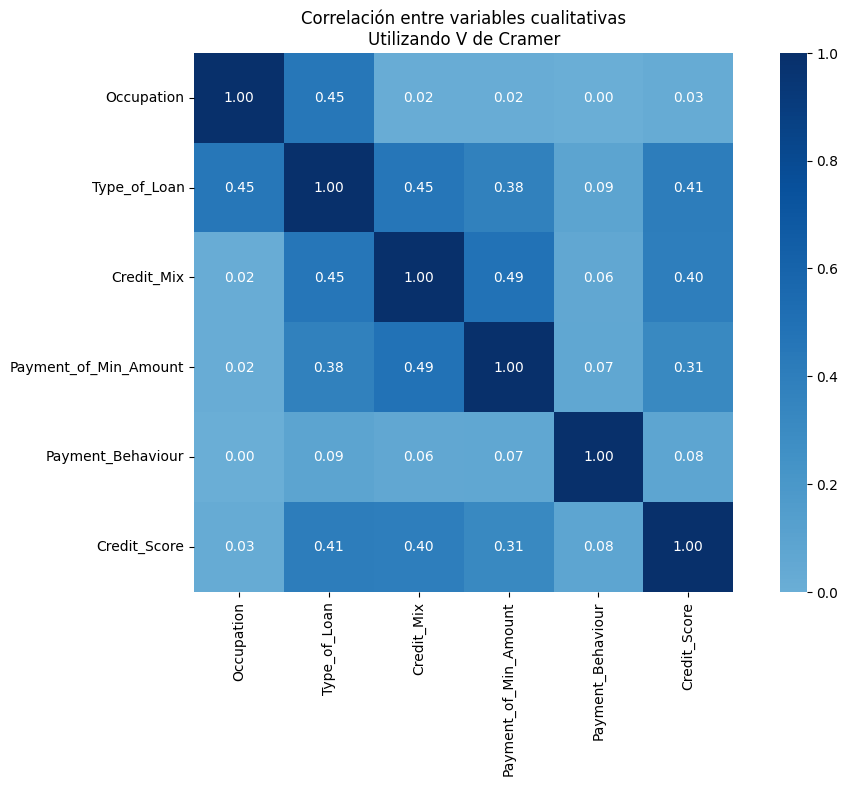

In [223]:
# Inicializamos la figura y sus ejes
fig, ax = plt.subplots(figsize = (12, 7))

# Estimar y generar el gráfico de asociación V de Cramer
v_cramer = associations(data_train.select_dtypes(exclude=['int64','float64']),
                        nom_nom_assoc = 'cramer',
                        ax = ax,
                        cmap = "Blues", 
                        title="Correlación entre variables cualitativas\nUtilizando V de Cramer")
plt.show()

## 03.05 Otras observaciones
### 03.05.01. Identificación de Missings por observación

In [224]:
#Proporción de missings por observación (como una nueva columna del dataset)
data_train['prop_missings'] = data_train.apply(lambda x: x.isna().sum()/data_train.shape[1]*100,axis=1)

# Valoramos distribución
data_train.prop_missings.describe()

count    100000.000000
mean          3.168609
std           3.471205
min           0.000000
25%           0.000000
50%           4.347826
75%           4.347826
max          26.086957
Name: prop_missings, dtype: float64

In [225]:
fig = px.histogram(data_train, x='prop_missings', marginal="box", nbins=14, range_x=[0, 25]) 
fig.show()

# 04. Almacenamiento de datos post exploración

In [226]:
pop = data_train.pop('prop_missings')

In [227]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Age                       100000 non-null  float64
 1   Occupation                100000 non-null  object 
 2   Annual_Income             100000 non-null  float64
 3   Monthly_Inhand_Salary     84998 non-null   float64
 4   Num_Bank_Accounts         100000 non-null  float64
 5   Num_Credit_Card           100000 non-null  float64
 6   Interest_Rate             100000 non-null  float64
 7   Num_of_Loan               100000 non-null  float64
 8   Type_of_Loan              100000 non-null  object 
 9   Delay_from_due_date       100000 non-null  float64
 10  Num_of_Delayed_Payment    92998 non-null   float64
 11  Changed_Credit_Limit      97909 non-null   float64
 12  Num_Credit_Inquiries      98035 non-null   float64
 13  Credit_Mix                79805 non-null   ob

In [228]:
data_train.to_csv(path_output + 'fixes_train.csv', index=False)

In [229]:
# # @title Convert ipynb to HTML in Colab
# # Upload ipynb
# from google.colab import files
# f = files.upload()

# # Convert ipynb to html
# import subprocess
# file0 = list(f.keys())[0]
# _ = subprocess.run(["pip", "install", "nbconvert"])
# _ = subprocess.run(["jupyter", "nbconvert", file0, "--to", "html"])

# # download the html
# files.download(file0[:-5]+"html")